
# 소상공인시장진흥공단 상가업소정보로 프랜차이즈 입점분석

배스킨라빈스와 던킨도너츠, 파리바게뜨와 뚜레주르는 근처에 입지한 것을 종종 볼 수 있다.\
프랜차이즈 매장간의 관계를 파악하는 프로젝트 

지도 시각화 패키지인 **Folium 실습**을 위한 교육\
https://www.inflearn.com/course/공공데이터로-파이썬-데이터-분석-시작하기# 의 강의를 보고 실습한 내용이다.

## 라이브러리 및 폰트 설정

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
plt.rc("font", family="AppleGothic")
plt.rc("axes", unicode_minus=False)

In [3]:
from IPython.display import set_matplotlib_formats

set_matplotlib_formats("retina")

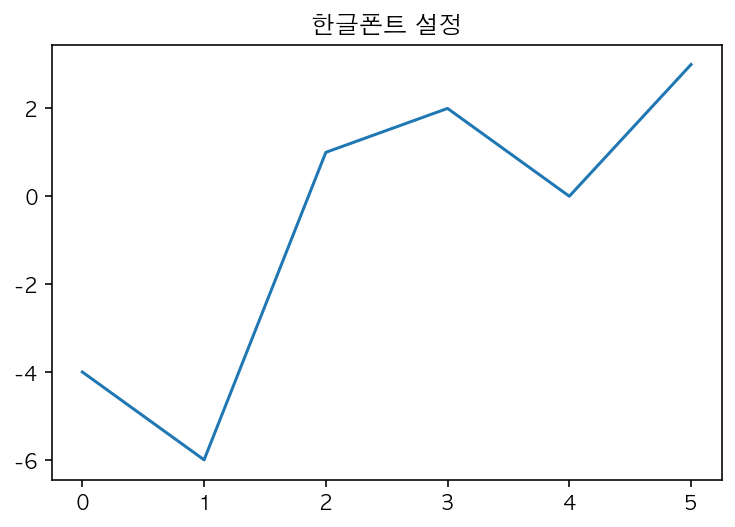

In [4]:
plt.title("한글폰트 설정")
plt.plot([-4, -6, 1, 2, 0, 3])

## 데이터 불러오기
공공데이터 포털 : https://www.data.go.kr/dataset/15012005/fileData.do

In [8]:
df = pd.read_csv("data/상가업소정보_201912_01.csv", sep='|')
df.head()

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
0,19905471,와라와라호프,NaN,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,I56219,...,1168010600106040000014378,대치상가,서울특별시 강남구 남부순환로 2933,135280,6280.0,NaN,1,NaN,127.061026,37.493922
1,19911397,커피빈코리아선릉로93길점,코리아선릉로93길점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1168010100106960042022041,NaN,서울특별시 강남구 선릉로93길 6,135080,6149.0,NaN,1,NaN,127.047883,37.505675
2,19911801,프로포즈,NaN,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,I56219,...,1154510200101620001017748,NaN,서울특별시 금천구 가산로 34-6,153010,8545.0,NaN,1,NaN,126.899220,37.471711
3,19912201,싱싱커피&토스트,NaN,Q,음식,Q07,패스트푸드,Q07A10,토스트전문,I56192,...,2653010400105780000002037,산업용품유통상가,부산광역시 사상구 괘감로 37,617726,46977.0,NaN,1,26,128.980455,35.159774
4,19932756,가락사우나내스낵,NaN,F,생활서비스,F09,대중목욕탕/휴게,F09A02,사우나/증기탕/온천,S96121,...,1171010500102560005010490,NaN,서울특별시 송파구 가락로 71,138846,5690.0,NaN,1,NaN,127.104071,37.500249


In [9]:
df.shape

(573680, 39)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 573680 entries, 0 to 573679
Data columns (total 39 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   상가업소번호     573680 non-null  int64  
 1   상호명        573679 non-null  object 
 2   지점명        76674 non-null   object 
 3   상권업종대분류코드  573680 non-null  object 
 4   상권업종대분류명   573680 non-null  object 
 5   상권업종중분류코드  573680 non-null  object 
 6   상권업종중분류명   573680 non-null  object 
 7   상권업종소분류코드  573680 non-null  object 
 8   상권업종소분류명   573680 non-null  object 
 9   표준산업분류코드   539290 non-null  object 
 10  표준산업분류명    539290 non-null  object 
 11  시도코드       573680 non-null  int64  
 12  시도명        573680 non-null  object 
 13  시군구코드      573680 non-null  int64  
 14  시군구명       573680 non-null  object 
 15  행정동코드      573680 non-null  int64  
 16  행정동명       573680 non-null  object 
 17  법정동코드      573680 non-null  int64  
 18  법정동명       573680 non-null  object 
 19  지번코드       573680 non-n

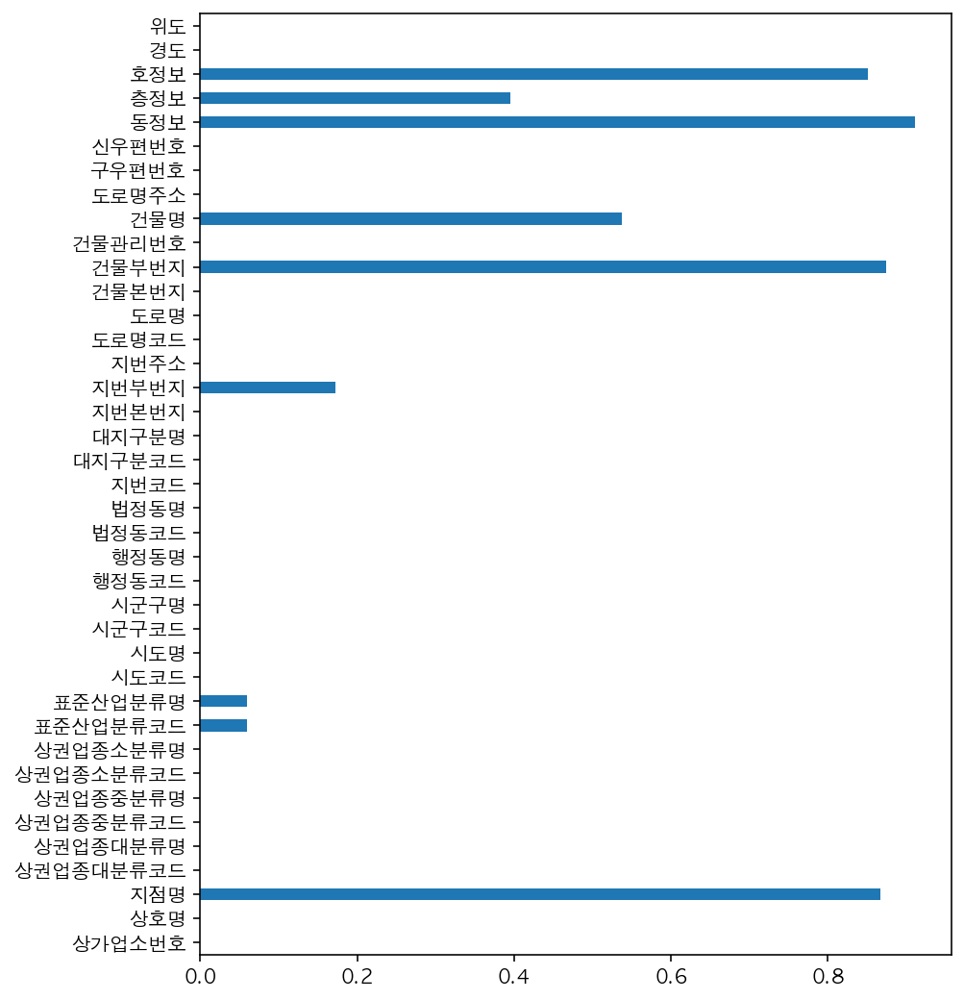

In [11]:
df.isnull().mean().plot.barh(figsize=(7, 9))

### 사용하지 않는 컬럼 제거하기

In [12]:
columns = ['상호명', '상권업종대분류명', '상권업종중분류명', '상권업종소분류명', 
           '시도명', '시군구명', '행정동명', '법정동명', '도로명주소', 
           '경도', '위도']
print(df.shape)
df = df[columns].copy()
df.shape

(573680, 39)


(573680, 11)

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 573680 entries, 0 to 573679
Data columns (total 11 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   상호명       573679 non-null  object 
 1   상권업종대분류명  573680 non-null  object 
 2   상권업종중분류명  573680 non-null  object 
 3   상권업종소분류명  573680 non-null  object 
 4   시도명       573680 non-null  object 
 5   시군구명      573680 non-null  object 
 6   행정동명      573680 non-null  object 
 7   법정동명      573680 non-null  object 
 8   도로명주소     573680 non-null  object 
 9   경도        573680 non-null  float64
 10  위도        573680 non-null  float64
dtypes: float64(2), object(9)
memory usage: 48.1+ MB


## 색인으로 서브셋 가져오기
### 서울만 따로 보기

In [14]:
df_seoul = df[df["시도명"] == "서울특별시"].copy()
print(df_seoul.shape)
df_seoul.head()

(407376, 11)


,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도
0,와라와라호프,음식,유흥주점,호프/맥주,서울특별시,강남구,대치1동,대치동,서울특별시 강남구 남부순환로 2933,127.061026,37.493922
1,커피빈코리아선릉로93길점,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 선릉로93길 6,127.047883,37.505675
2,프로포즈,음식,유흥주점,호프/맥주,서울특별시,금천구,독산3동,독산동,서울특별시 금천구 가산로 34-6,126.899220,37.471711
4,가락사우나내스낵,생활서비스,대중목욕탕/휴게,사우나/증기탕/온천,서울특별시,송파구,석촌동,석촌동,서울특별시 송파구 가락로 71,127.104071,37.500249
5,초밥왕,음식,일식/수산물,음식점-초밥전문,서울특별시,송파구,잠실6동,신천동,서울특별시 송파구 올림픽로 293-19,127.102490,37.515149


In [15]:
df_seoul["시군구명"].unique()

array(['강남구', '금천구', '송파구', '광진구', '강서구', '중구', '서초구', '성북구', '구로구',
       '영등포구', '서대문구', '동대문구', '노원구', '동작구', '성동구', '관악구', '강동구', '양천구',
       '종로구', '강북구', '은평구', '중랑구', '도봉구', '마포구', '용산구'], dtype=object)

In [16]:
df_seoul["시군구명"].nunique()

25

## 파일로 저장하기

In [17]:
df_seoul.to_csv("seoul_open_store.csv", index=False)

In [18]:
pd.read_csv("seoul_open_store.csv").head()

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도
0,와라와라호프,음식,유흥주점,호프/맥주,서울특별시,강남구,대치1동,대치동,서울특별시 강남구 남부순환로 2933,127.061026,37.493922
1,커피빈코리아선릉로93길점,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 선릉로93길 6,127.047883,37.505675
2,프로포즈,음식,유흥주점,호프/맥주,서울특별시,금천구,독산3동,독산동,서울특별시 금천구 가산로 34-6,126.899220,37.471711
3,가락사우나내스낵,생활서비스,대중목욕탕/휴게,사우나/증기탕/온천,서울특별시,송파구,석촌동,석촌동,서울특별시 송파구 가락로 71,127.104071,37.500249
4,초밥왕,음식,일식/수산물,음식점-초밥전문,서울특별시,송파구,잠실6동,신천동,서울특별시 송파구 올림픽로 293-19,127.102490,37.515149


## 배스킨라빈스, 던킨도너츠 위치 분석

### 특정 상호만 가져오기

In [19]:
df_seoul["상호명_소문자"] = df_seoul["상호명"].str.lower()

In [20]:
df_seoul["상호명_소문자"].str.extract("(베|배)스킨라빈스|baskinrobbins")[0].value_counts()

배    347
베    117
Name: 0, dtype: int64

In [21]:
df_seoul.loc[df_seoul["상호명_소문자"].str.contains("배스킨라빈스|베스킨라빈스|baskinrobbins"), "상호명_소문자"].shape

(466,)

In [22]:
df_seoul.loc[df_seoul["상호명_소문자"].str.contains("던킨|dunkin"), "상호명_소문자"].shape

(191,)

In [23]:
df_31 = df_seoul[df_seoul["상호명_소문자"].str.contains(
    '배스킨라빈스|베스킨라빈스|baskinrobbins|던킨|dunkin')].copy()
df_31.shape

(657, 12)

In [24]:
df_31.loc[df_31["상호명_소문자"].str.contains("배스킨라빈스|베스킨라빈스|baskinrobbins"), 
          "브랜드명"] = "배스킨라빈스"
df_31[["상호명", "브랜드명"]].head()

,상호명,브랜드명
76,배스킨라빈스,배스킨라빈스
1167,던킨도너츠,NaN
1819,던킨도너츠테크노마트점,NaN
2164,베스킨라빈스,배스킨라빈스
2305,던킨도너츠창동하나로,NaN


In [25]:
df_31["브랜드명"] = df_31["브랜드명"].fillna("던킨도너츠")
df_31["브랜드명"]

76        배스킨라빈스
1167       던킨도너츠
1819       던킨도너츠
2164      배스킨라빈스
2305       던킨도너츠
           ...  
558894     던킨도너츠
560984     던킨도너츠
561929    배스킨라빈스
561930    배스킨라빈스
569825     던킨도너츠
Name: 브랜드명, Length: 657, dtype: object

In [26]:
df_31["상권업종대분류명"].value_counts()

음식       655
생활서비스      1
소매         1
Name: 상권업종대분류명, dtype: int64

In [27]:
df_31[df_31["상권업종대분류명"].isin(["소매", "생활서비스"])]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자,브랜드명
358699,배스킨라빈스,소매,종합소매점,할인점,서울특별시,강남구,압구정동,신사동,서울특별시 강남구 압구정로 204,127.029381,37.527375,배스킨라빈스,배스킨라빈스
556592,baskinrobbins,생활서비스,광고/인쇄,인쇄종합,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 강남대로 396,127.028289,37.498154,baskinrobbins,배스킨라빈스


In [28]:
df_31 = df_31[~df_31["상권업종대분류명"].isin(["소매", "생활서비스"])].copy()
df_31.shape

(655, 13)

### 범주형 값으로 countplot 그리기

In [29]:
brand_count = df_31["브랜드명"].value_counts()
brand_count

배스킨라빈스    464
던킨도너츠     191
Name: 브랜드명, dtype: int64

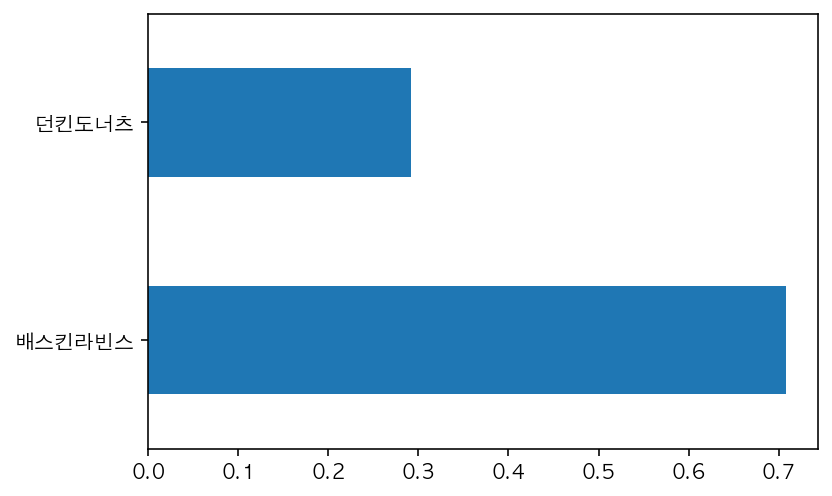

In [30]:
df_31["브랜드명"].value_counts(normalize=True).plot.barh()

In [31]:
brand_count.index

Index(['배스킨라빈스', '던킨도너츠'], dtype='object')

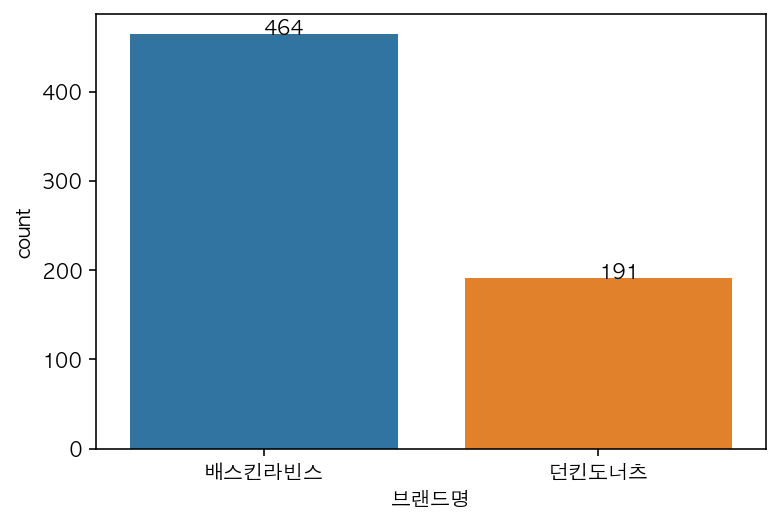

In [32]:
g = sns.countplot(data=df_31, x="브랜드명")

for i, val in enumerate(brand_count.index):
    g.text(x=i, y=brand_count[i], s=brand_count[i])

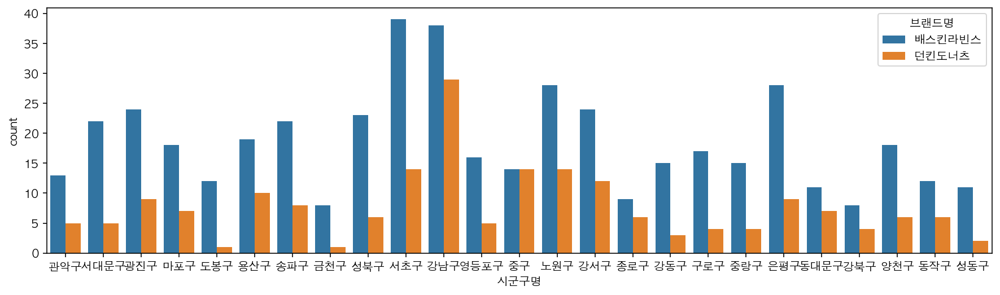

In [33]:
plt.figure(figsize=(15, 4))
g = sns.countplot(data=df_31, x="시군구명", hue="브랜드명")

In [34]:
table_city_brand = df_31.pivot_table(index="시군구명", columns="브랜드명", values="상호명", aggfunc="count")
table_city_brand.head()

브랜드명,던킨도너츠,배스킨라빈스
시군구명,,
강남구,29,38
강동구,3,15
강북구,4,8
강서구,12,24
관악구,5,13


In [35]:
for i, val in table_city_brand.iterrows():
    dunkin = val["던킨도너츠"]
    baskin = val["배스킨라빈스"]
    print(dunkin, baskin)

29 38
3 15
4 8
12 24
5 13
9 24
4 17
1 8
14 28
1 12
7 11
6 12
7 18
5 22
14 39
2 11
6 23
8 22
6 18
5 16
10 19
9 28
6 9
14 14
4 15


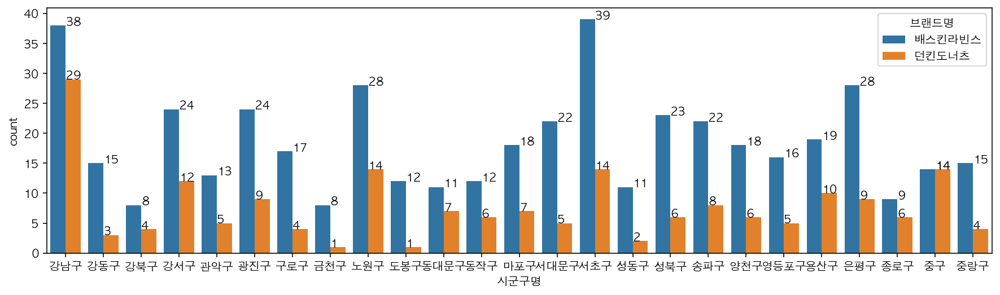

In [36]:
plt.figure(figsize=(15, 4))

g = sns.countplot(data=df_31, x="시군구명", hue="브랜드명", order=table_city_brand.index)


index_no = 0
for i, val in table_city_brand.iterrows():
    dunkin = val["던킨도너츠"]
    baskin = val["배스킨라빈스"]
    g.text(x=index_no, y=dunkin, s=dunkin)
    g.text(x=index_no, y=baskin, s=baskin)
    index_no = index_no + 1

### scatterplot 그리기

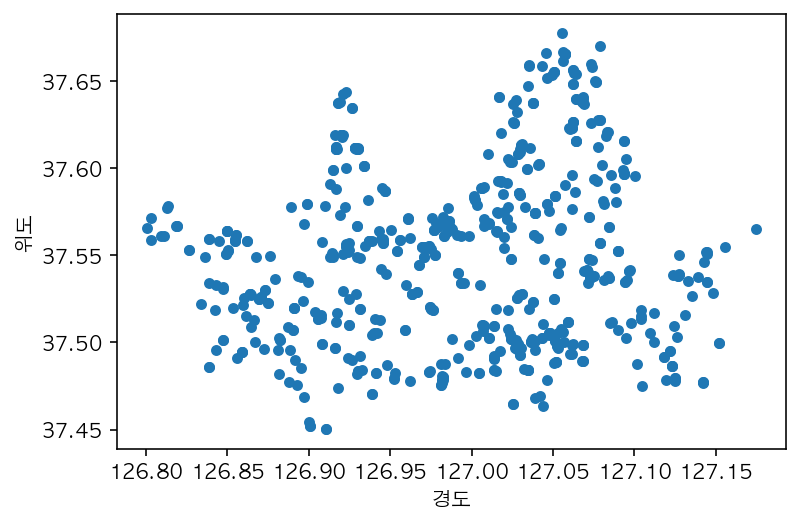

In [37]:
df_31[["위도", "경도"]].plot.scatter(x="경도", y="위도")

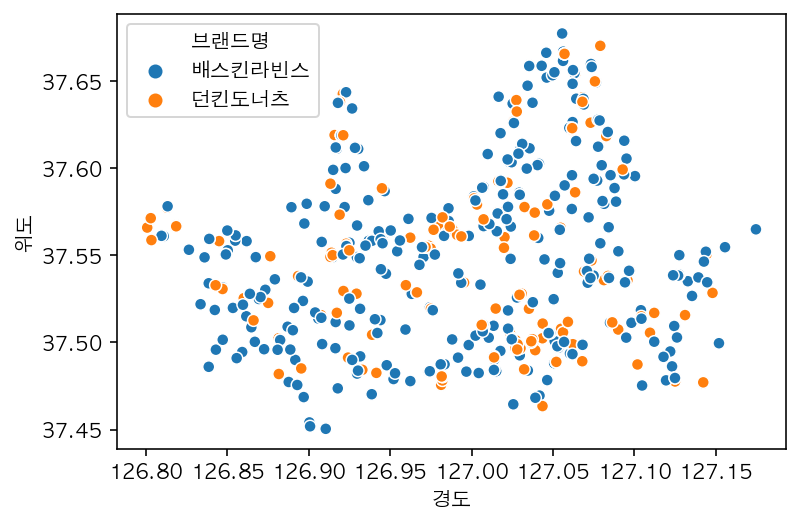

In [38]:
sns.scatterplot(data=df_31, x="경도", y="위도", hue="브랜드명")

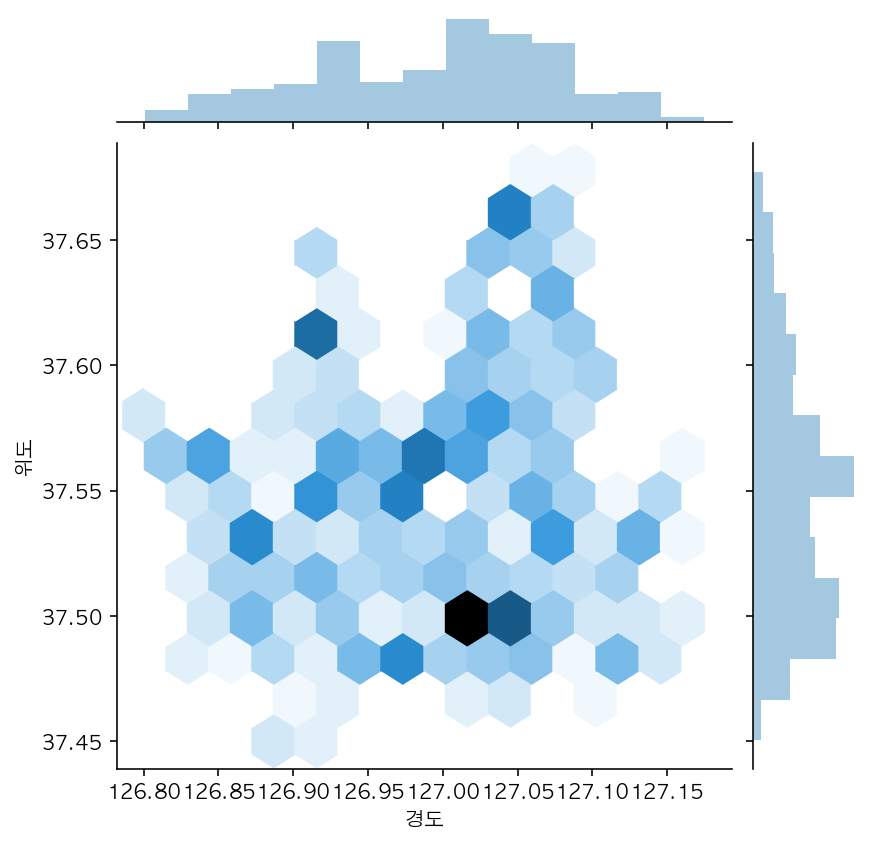

In [39]:
sns.jointplot(data=df_31, x="경도", y="위도", kind="hex")

In [40]:
import folium

In [41]:
lat = df_31["위도"].mean()
long = df_31["경도"].mean()
lat, long

(37.548567678569086, 126.99419527148791)

In [42]:
m = folium.Map([lat, long])
# 127.039032	37.495593
folium.Marker(
    [37.495593, 127.039032], 
    popup='<i>던킨도너츠</i>', 
    tooltip="던킨도너츠").add_to(m)
m.save('index.html')
m

In [43]:
df_31.sample(random_state=31)

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자,브랜드명
276889,던킨도너츠,음식,패스트푸드,도너츠전문,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 논현로 341,127.039032,37.495593,던킨도너츠,던킨도너츠


In [44]:
m.save('index.html')

In [45]:
df_31.index

Int64Index([    76,   1167,   1819,   2164,   2305,   2342,   3007,  11060,
             13042,  13925,
            ...
            554896, 555145, 557464, 557822, 558006, 558894, 560984, 561929,
            561930, 569825],
           dtype='int64', length=655)

### 기본 마커로 표현하기

In [46]:
# icon=folium.Icon(color=icon_color) 로 아이콘 컬러를 변경
m = folium.Map([lat, long], zoom_start=12)

for i in df_31.index:
    
    sub_lat = df_31.loc[i, "위도"]
    sub_long = df_31.loc[i, "경도"]
    title = df_31.loc[i, "상호명"] + " - " + df_31.loc[i, "도로명주소"]
    
    icon_color = "blue"
    if df_31.loc[i, "브랜드명"] == "던킨도너츠":
        icon_color = "red"
    
    folium.Marker(
        [sub_lat, sub_long], 
        icon=folium.Icon(color=icon_color),
        popup=f'<i>{title}</i>', 
        tooltip=title).add_to(m)

m.save('index.html')
m

### MarkerCluster 로 표현하기
* https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/MarkerCluster.ipynb

In [47]:
MarkerCluster?

Object `MarkerCluster` not found.


In [48]:
# icon=folium.Icon(color=icon_color) 로 아이콘 컬러를 변경
from folium.plugins import MarkerCluster

m = folium.Map([lat, long], zoom_start=12)
marker_cluster = MarkerCluster().add_to(m)

for i in df_31.index:
    
    sub_lat = df_31.loc[i, "위도"]
    sub_long = df_31.loc[i, "경도"]
    title = df_31.loc[i, "상호명"] + " - " + df_31.loc[i, "도로명주소"]
    
    icon_color = "blue"
    if df_31.loc[i, "브랜드명"] == "던킨도너츠":
        icon_color = "red"
    
    folium.Marker(
        [sub_lat, sub_long], 
        icon=folium.Icon(color=icon_color),
        popup=f'<i>{title}</i>', 
        tooltip=title).add_to(marker_cluster)

m.save('index.html')
m

## 파리바게뜨와 뚜레주르 분석하기

In [49]:
df_seoul["상호명"].str.extract("뚜레(주|쥬)르")[0].value_counts()

쥬    257
주      1
Name: 0, dtype: int64

In [50]:
df_bread = df_seoul[df_seoul["상호명"].str.contains("뚜레(주|쥬)르|파리(바게|크라상)")].copy()
df_bread.shape

/Users/corazzon/opt/anaconda3/lib/python3.7/site-packages/pandas/core/strings.py:1954: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


(825, 12)

In [51]:
df_bread["상권업종대분류명"].value_counts()

음식       823
학문/교육      2
Name: 상권업종대분류명, dtype: int64

In [52]:
df_bread[df_bread["상권업종대분류명"] == "학문/교육"]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자
354693,파리바게뜨교육소,학문/교육,학원-자격/국가고시,학원-제과기술,서울특별시,영등포구,영등포동,영등포동8가,서울특별시 영등포구 영중로 159,126.905405,37.530553,파리바게뜨교육소
406627,뚜레쥬르,학문/교육,학원-자격/국가고시,학원-제과기술,서울특별시,금천구,가산동,가산동,서울특별시 금천구 가산디지털1로 128,126.883684,37.477224,뚜레쥬르


In [53]:
print(df_bread.shape)
df_bread = df_bread[df_bread["상권업종대분류명"] != "학문/교육"].copy()
print(df_bread.shape)

(825, 12)
(823, 12)


In [55]:
df_bread[df_bread["상호명"].str.contains('파스쿠찌|잠바주스')]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자
150108,파리크라상파스쿠찌홍,음식,커피점/카페,커피전문점/카페/다방,서울특별시,마포구,서강동,상수동,서울특별시 마포구 와우산로 94,126.924922,37.552600,파리크라상파스쿠찌홍
150916,파리크라상파스쿠찌압,음식,제과제빵떡케익,제과점,서울특별시,강남구,압구정동,신사동,서울특별시 강남구 논현로 868,127.028866,37.526073,파리크라상파스쿠찌압
165698,파리크라상파스쿠찌서,음식,커피점/카페,커피전문점/카페/다방,서울특별시,종로구,이화동,연건동,서울특별시 종로구 대학로5가길 23,127.001032,37.578832,파리크라상파스쿠찌서
166894,파리크라상파스쿠찌도,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강남구,삼성1동,삼성동,서울특별시 강남구 테헤란로87길 22,127.059427,37.509624,파리크라상파스쿠찌도
167937,파리크라상파스쿠찌서,음식,커피점/카페,커피전문점/카페/다방,서울특별시,종로구,이화동,연건동,서울특별시 종로구 대학로 101,126.997184,37.580448,파리크라상파스쿠찌서
173293,파리크라상파스쿠찌압구정역2호,음식,제과제빵떡케익,제과점,서울특별시,강남구,신사동,신사동,서울특별시 강남구 압구정로 162,127.027449,37.526305,파리크라상파스쿠찌압구정역2호
173492,파리크라상잠바주스디큐브,음식,커피점/카페,생과일주스전문점,서울특별시,구로구,신도림동,신도림동,서울특별시 구로구 경인로 662,126.888485,37.508058,파리크라상잠바주스디큐브
173775,파리크라상잠바주스대치역,음식,제과제빵떡케익,제과점,서울특별시,강남구,대치1동,대치동,서울특별시 강남구 남부순환로 2942,127.062308,37.493635,파리크라상잠바주스대치역
263755,파리크라상잠바주스동,음식,제과제빵떡케익,제과점,서울특별시,용산구,이촌1동,이촌동,서울특별시 용산구 이촌로 245,126.974348,37.520170,파리크라상잠바주스동
267247,파리크라상잠바주스삼,음식,제과제빵떡케익,제과점,서울특별시,서초구,서초2동,서초동,서울특별시 서초구 서초대로78길 22,127.027528,37.495796,파리크라상잠바주스삼


In [56]:
print(df_bread.shape)
df_bread = df_bread[~df_bread["상호명"].str.contains('파스쿠찌|잠바주스')].copy()
print(df_bread.shape)

(823, 12)
(812, 12)


In [57]:
df_bread.loc[df_bread["상호명"].str.contains("파리바게"), "브랜드명"] = "파리바게뜨"
df_bread.loc[df_bread["상호명"].str.contains("파리크라상"), "브랜드명"] = "파리바게뜨"
df_bread.loc[df_bread["상호명"].str.contains("뚜레"), "브랜드명"] = "뚜레쥬르"
df_bread[["상호명", "브랜드명"]].head()

,상호명,브랜드명
2935,뚜레쥬르,뚜레쥬르
13843,뚜레쥬르,뚜레쥬르
14031,파리바게뜨길동사거리점,파리바게뜨
14229,파리바게뜨상계제일점,파리바게뜨
14246,뚜레쥬르중계브라운,뚜레쥬르


In [58]:
df_bread["브랜드명"].isnull().value_counts()

False    812
Name: 브랜드명, dtype: int64

In [59]:
df_bread[df_bread["브랜드명"].isnull() == True]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자,브랜드명


In [60]:
df_bread["브랜드명"] = df_bread["브랜드명"].fillna("뚜레쥬르")
df_bread[["상호명", "브랜드명"]].head()

,상호명,브랜드명
2935,뚜레쥬르,뚜레쥬르
13843,뚜레쥬르,뚜레쥬르
14031,파리바게뜨길동사거리점,파리바게뜨
14229,파리바게뜨상계제일점,파리바게뜨
14246,뚜레쥬르중계브라운,뚜레쥬르


### 범주형 변수 빈도수 계산하기

In [61]:
df_bread["브랜드명"].value_counts()

파리바게뜨    555
뚜레쥬르     257
Name: 브랜드명, dtype: int64

In [62]:
df_bread["브랜드명"].value_counts(normalize=True)

파리바게뜨    0.683498
뚜레쥬르     0.316502
Name: 브랜드명, dtype: float64

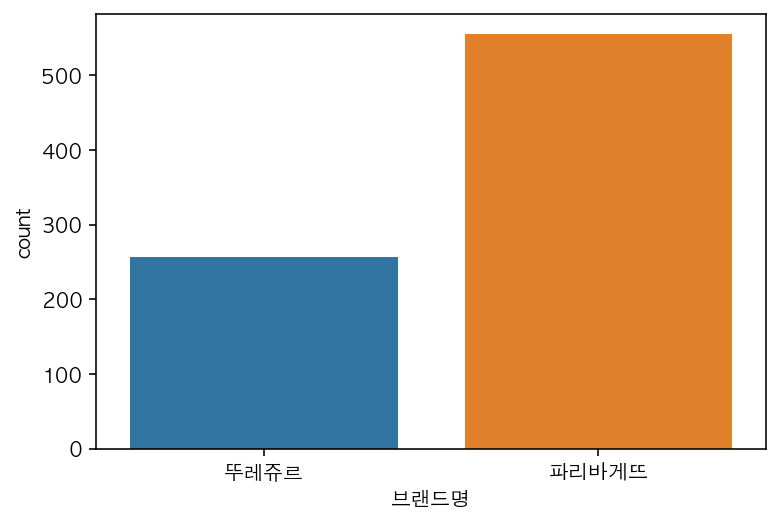

In [63]:
sns.countplot(data=df_bread, x="브랜드명")

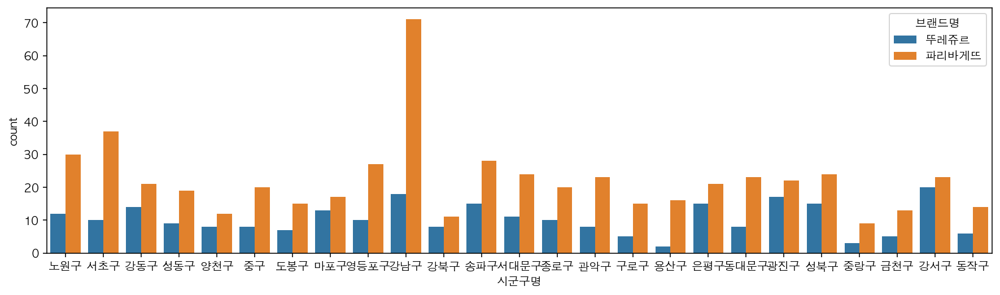

In [64]:
plt.figure(figsize=(15, 4))
sns.countplot(data=df_bread, x="시군구명", hue="브랜드명")

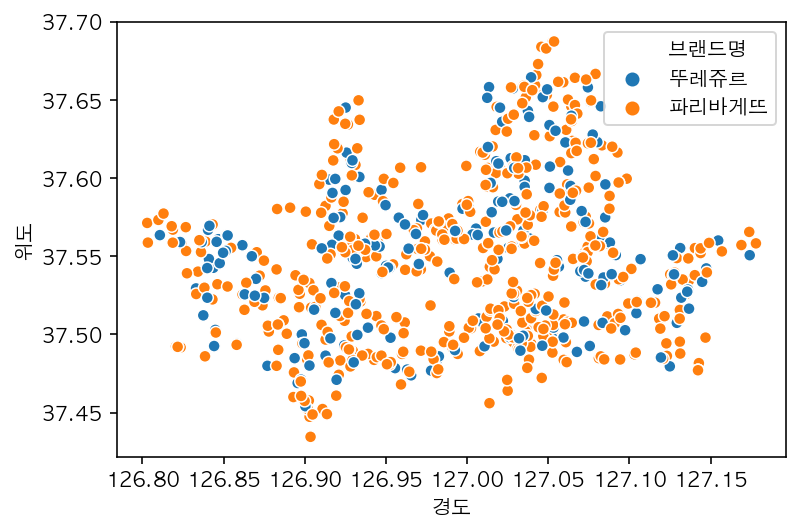

In [65]:
sns.scatterplot(data=df_bread, x="경도", y="위도", hue="브랜드명")

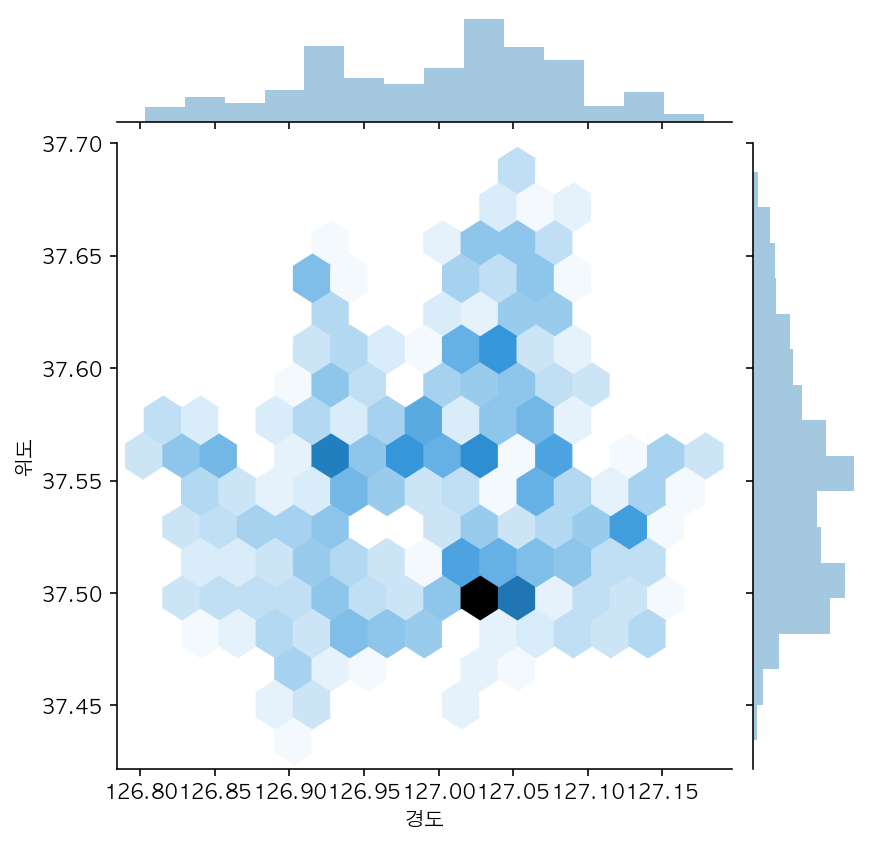

In [66]:
sns.jointplot(data=df_bread, x="경도", y="위도", kind="hex")

## 지도에 표현하기
### Marker 로 위치를 찍어보기

In [67]:
df_bread.index

Int64Index([  2935,  13843,  14031,  14229,  14246,  14713,  14842,  14889,
             14897,  15019,
            ...
            544366, 544527, 551365, 555475, 556168, 559820, 561538, 561810,
            569327, 569479],
           dtype='int64', length=812)

In [68]:
df_bread.loc[2935, "위도"]

37.62828881495879

In [70]:
# icon=folium.Icon(color=icon_color) 로 아이콘 컬러를 변경
m = folium.Map([lat, long], zoom_start=12, tiles="stamen toner")

for i in df_bread.index:
    sub_lat = df_bread.loc[i, "위도"]
    sub_long = df_bread.loc[i, "경도"]
    
    title = df_bread.loc[i, "상호명"] + " - " + df_bread.loc[i, "도로명주소"]
    
    icon_color = "blue"
    if df_bread.loc[i, "브랜드명"] == "뚜레쥬르":
        icon_color = "green"

    folium.CircleMarker(
        [sub_lat,sub_long ], 
        radius=3,
        color=icon_color,
        popup=f'<i>{title}</i>', 
        tooltip=title).add_to(m)

m.save('paris-tour.html')
m

### MarkerCluster 로 표현하기

In [71]:
m = folium.Map([lat, long], zoom_start=12, tiles="stamen toner")

marker_cluster = MarkerCluster().add_to(m)

for i in df_bread.index:
    sub_lat = df_bread.loc[i, "위도"]
    sub_long = df_bread.loc[i, "경도"]
    
    title = df_bread.loc[i, "상호명"] + " - " + df_bread.loc[i, "도로명주소"]
    
    icon_color = "blue"
    if df_bread.loc[i, "브랜드명"] == "뚜레쥬르":
        icon_color = "green"

    folium.CircleMarker(
        [sub_lat,sub_long ], 
        radius=3,
        color=icon_color,
        popup=f'<i>{title}</i>', 
        tooltip=title).add_to(marker_cluster)

m.save('paris-tour.html')
m

### Heatmap 으로 그리기
https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/Heatmap.ipynb

In [72]:
# heatmap 예제 이해하기

data = (
    np.random.normal(size=(100, 3)) *
    np.array([[1, 1, 1]]) +
    np.array([[48, 5, 1]])
).tolist()
data[:5]

[[46.79547577778116, 5.85552755427052, 1.6031181492656166],
 [47.084562372202974, 4.541782339247465, -0.46501014385480577],
 [48.28564719638221, 4.962885272004957, -0.5698773555950609],
 [47.576512272285264, 6.442250821431104, 3.3614822793773103],
 [46.86328764638138, 5.632999152410842, 1.4669655631489622]]

In [73]:
# heatmap 예제와 같은 형태로 데이터 2차원 배열 만들기
heat = df_bread[["위도", "경도", "브랜드명"]].copy()
heat["브랜드명"] = heat["브랜드명"].str.strip()
heat["브랜드명"] = heat["브랜드명"].replace("뚜레쥬르", 1).replace("파리바게뜨", 1)
heat = heat.values
# heat

In [74]:
heat[:5]

array([[ 37.62828881, 127.07729473,   1.        ],
       [ 37.49809817, 127.02590362,   1.        ],
       [ 37.53415376, 127.13650069,   1.        ],
       [ 37.66136731, 127.059227  ,   1.        ],
       [ 37.63991755, 127.06424515,   1.        ]])

In [75]:
# HeatMap 그리기
from folium.plugins import HeatMap

m = folium.Map([lat, long], tiles='stamentoner', zoom_start=12)


for i in df_bread.index:
    sub_lat = df_bread.loc[i, "위도"]
    sub_long = df_bread.loc[i, "경도"]
    
    title = df_bread.loc[i, "상호명"] + " - " + df_bread.loc[i, "도로명주소"]
    
    icon_color = "blue"
    if df_bread.loc[i, "브랜드명"] == "뚜레쥬르":
        icon_color = "green"

    folium.CircleMarker(
        [sub_lat,sub_long ], 
        radius=3,
        color=icon_color,
        popup=f'<i>{title}</i>', 
        tooltip=title).add_to(m)

    
HeatMap(heat).add_to(m)

m.save('Heatmap.html')

m

In [76]:
df_academy = df[(df["상권업종대분류명"] == '학문/교육') & (df["시군구명"] == "종로구")]

In [77]:
df_academy.groupby(['시군구명'])['상권업종소분류명'].value_counts()

시군구명  상권업종소분류명   
종로구   학원(종합)         105
      학원-외국어/어학       79
      학원-입시           75
      어린이집            72
      피아노/바이올린/기타     45
      고시원             41
      서예/서화/미술        39
      학원-기타           26
      독서실             23
      컴퓨터학원           13
      학원-요리           10
      학원-스포츠/재즈댄스      9
      학습지보급            8
      학원-복장            7
      학원-편입            7
      학원-디자인           5
      학원-무용            5
      학원-심리변론          5
      학원-어린이영어         5
      학원-국가고시          4
      학원-미용            4
      유아교육기관기타         3
      태권도장             3
      학원-국악            3
      학원-목공예           3
      학원-보석감정          3
      학원-사교춤           3
      학원-주산암산부기속셈      3
      학원-웅변            2
      학원-침술            2
      학원-한복기술          2
      학원/국가고시          2
      검도도장             1
      놀이방              1
      시험정보안내           1
      운동/코치학교          1
      운전연수전문           1
      유도장              1
      이동도서관운영          1
      학

In [78]:
df_academy.groupby(['시군구명','상권업종소분류명'])['상호명'].count().sort_values(ascending=False)

시군구명  상권업종소분류명   
종로구   학원(종합)         105
      학원-외국어/어학       79
      학원-입시           75
      어린이집            72
      피아노/바이올린/기타     45
      고시원             41
      서예/서화/미술        39
      학원-기타           26
      독서실             23
      컴퓨터학원           13
      학원-요리           10
      학원-스포츠/재즈댄스      9
      학습지보급            8
      학원-편입            7
      학원-복장            7
      학원-무용            5
      학원-디자인           5
      학원-심리변론          5
      학원-어린이영어         5
      학원-국가고시          4
      학원-미용            4
      학원-목공예           3
      태권도장             3
      유아교육기관기타         3
      학원-국악            3
      학원-사교춤           3
      학원-주산암산부기속셈      3
      학원-보석감정          3
      학원-침술            2
      학원-웅변            2
      학원-한복기술          2
      학원/국가고시          2
      운전연수전문           1
      운동/코치학교          1
      유도장              1
      이동도서관운영          1
      놀이방              1
      시험정보안내           1
      합기도장             1
      학